In [170]:
import numpy as np
import pandas as pd # for data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [171]:
!pip install imutils
!pip install "numpy<2" # I had a weird compatibility issue

In [172]:
!pip install opencv-contrib-python==3.4.17.63

In [173]:
from imutils import paths
import cv2

In [174]:
#class 
class utils:
    def loadImages(path,resize):
        '''Load Images from path to array, @param path is the folder which containing images, @param resize is True
        if image is halved in size, otherwise is False'''
        image_path = list(paths.list_images(path))
        list_image = []
        for i,j in enumerate(image_path):
            image = cv2.imread(j)
            if resize==1:
                image=cv2.resize(image,(int(image.shape[1]/4),int(image.shape[0]/4)))
            list_image.append(image)
        return (list_image)

    def trim(frame):
        '''crop frame '''
        #crop top
        if not np.sum(frame[0]):
            return trim(frame[1:])
        #crop bottom
        elif not np.sum(frame[-1]):
            return trim(frame[:-2])
        #crop left
        elif not np.sum(frame[:,0]):
            return trim(frame[:,1:]) 
        #crop right
        elif not np.sum(frame[:,-1]):
            return trim(frame[:,:-2])    
        return frame

    def padding(img,top,bottom,left,right):
        '''add padding to img'''
        border = cv2.copyMakeBorder(
            img,
            top=top,
            bottom=bottom,
            left=left,
            right=right,
            borderType=cv2.BORDER_CONSTANT
        )
        return border

In [175]:
 
class features:
    def findAndDescribeFeatures(image,opt='ORB'):
        '''find and describe features of @image,
        if opt='SURF', SURF algorithm is used.
        if opt='SIFT', SIFT algorithm is used.
        if opt='ORB', ORB algorithm is used.
        @Return keypoints and features of img'''
        #Getting gray image
        grayImage = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        if opt=='SURF':
            md = cv2.xfeatures2d.SURF_create()
        if opt=='ORB':
            md = cv2.ORB_create(nfeatures=3000)
        if opt=='SIFT':
            md = cv2.xfeatures2d.SIFT_create()
        #Find interest points and Computing features.
        keypoints, features = md.detectAndCompute(grayImage, None)
        #Converting keypoints to numbers.
        #keypoints = np.float32(keypoints)
        features = np.float32(features)
        return keypoints, features

    def matchFeatures(featuresA, featuresB,ratio=0.75,opt='FB'):
        '''matching features beetween 2 @features.
         If opt='FB', FlannBased algorithm is used.
         If opt='BF', BruteForce algorithm is used.
         @ratio is the Lowe's ratio test.
         @return matches'''
        if opt=='BF':
            featureMatcher = cv2.DescriptorMatcher_create("BruteForce")
        if opt=='FB':
            #featureMatcher = cv2.DescriptorMatcher_create("FlannBased")
            FLANN_INDEX_KDTREE = 0
            index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
            search_params = dict(checks = 50)
            featureMatcher = cv2.FlannBasedMatcher(index_params, search_params)


        #performs k-NN matching between the two feature vector sets using k=2 
        #(indicating the top two matches for each feature vector are returned).
        matches = featureMatcher.knnMatch(featuresA,featuresB, k=2)

        # store all the good matches as per Lowe's ratio test.
        good = []
        for m,n in matches:
            if m.distance<ratio*n.distance:
                good.append(m)
        if len(good)>4:
            return good
        else:
            raise Exception("Not enought matches") 

    def generateHomography(src_img, dst_img, ransacRep=5.0):
        '''@Return Homography matrix, @param src_img is the image which is warped by homography,
        @param dst_img is the image which is choosing as pivot, @param ratio is the David Lowe’s ratio,
        @param ransacRep is the maximum pixel “wiggle room” allowed by the RANSAC algorithm
        '''

        src_kp,src_features=features.findAndDescribeFeatures(src_img)
        dst_kp,dst_features=features.findAndDescribeFeatures(dst_img)

        good=features.matchFeatures(src_features,dst_features)

        src_points = np.float32([src_kp[m.queryIdx].pt for m in good]).reshape(-1,1,2)
        dst_points = np.float32([dst_kp[m.trainIdx].pt for m in good]).reshape(-1,1,2)

        H, mask  = cv2.findHomography(src_points, dst_points, cv2.RANSAC,ransacRep)
        matchesMask = mask.ravel().tolist()
        return H,matchesMask


    def drawKeypoints(img,kp):
        img1=img
        cv2.drawKeypoints(img,kp,img1,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        return img1

    def drawMatches(src_img,src_kp,dst_img,dst_kp,matches,matchesMask):
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                       singlePointColor = None,
                       matchesMask = matchesMask[:100], # draw only inliers
                       flags = 2)
        return cv2.drawMatches(src_img,src_kp,dst_img,dst_kp,matches[:],None,**draw_params)

In [176]:
class stitch:
    @staticmethod
    def blendingMask(height, width, barrier, smoothing_window, left_biased):
        mask = np.zeros((height, width), dtype=np.float32)
        offset = smoothing_window // 2
        start = max(barrier - offset, 0)
        end = min(barrier + offset + 1, width)
        window_length = end - start
        blend = np.linspace(1, 0, window_length) if left_biased else np.linspace(0, 1, window_length)
        blend_window = np.tile(blend, (height, 1))
        mask[:, start:end] = blend_window
        if left_biased:
            mask[:, :start] = 1
        else:
            mask[:, end:] = 1
        return mask

    @staticmethod
    def panoramaBlending(dst_img_rz, src_img_warped, width_dst, side, showstep=False):
        h, w, _ = dst_img_rz.shape
        smoothing_window = int(width_dst / 8)
        barrier = width_dst - int(smoothing_window / 2)
        mask1 = stitch.blendingMask(h, w, barrier, smoothing_window, left_biased=True)
        mask2 = stitch.blendingMask(h, w, barrier, smoothing_window, left_biased=False)

        if showstep:
            nonblend = src_img_warped + dst_img_rz
        else:
            nonblend = None
            leftside = None
            rightside = None

        if side == 'left':
            dst_img_rz = cv2.flip(dst_img_rz, 1)
            src_img_warped = cv2.flip(src_img_warped, 1)
            dst_img_rz = (dst_img_rz * mask1[..., None])
            src_img_warped = (src_img_warped * mask2[..., None])
            pano = src_img_warped + dst_img_rz
            pano = cv2.flip(pano, 1)
            if showstep:
                leftside = cv2.flip(src_img_warped, 1)
                rightside = cv2.flip(dst_img_rz, 1)
        else:
            dst_img_rz = (dst_img_rz * mask1[..., None])
            src_img_warped = (src_img_warped * mask2[..., None])
            pano = src_img_warped + dst_img_rz
            if showstep:
                leftside = dst_img_rz
                rightside = src_img_warped

        return pano, nonblend, leftside, rightside

    @staticmethod
    def warpTwoImages(src_img, dst_img, showstep=False):
        H, _ = features.generateHomography(src_img, dst_img)
        height_src, width_src = src_img.shape[:2]
        height_dst, width_dst = dst_img.shape[:2]
        pts1 = np.float32([[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]).reshape(-1, 1, 2)
        pts2 = np.float32([[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]).reshape(-1, 1, 2)
        try:
            pts1_ = cv2.perspectiveTransform(pts1, H)
            pts = np.concatenate((pts1_, pts2), axis=0)
            [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
            [xmax, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
            t = [-xmin, -ymin]
            if pts[0][0][0] < 0:
                side = 'left'
                width_pano = width_dst + t[0]
            else:
                side = 'right'
                width_pano = int(pts1_[3][0][0])
            height_pano = ymax - ymin

            Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
            src_img_warped = cv2.warpPerspective(src_img, Ht.dot(H), (width_pano, height_pano))
            dst_img_rz = np.zeros((height_pano, width_pano, 3), dtype=dst_img.dtype)
            if side == 'left':
                y1, y2 = t[1], t[1] + height_src
                x1, x2 = t[0], t[0] + width_dst
                h_dst, w_dst = dst_img.shape[:2]
                h_rz, w_rz = dst_img_rz[y1:y2, x1:x2].shape[:2]
                h = min(h_dst, h_rz)
                w = min(w_dst, w_rz)
                dst_img_rz[y1:y1 + h, x1:x1 + w] = dst_img[:h, :w]
            else:
                y1, y2 = t[1], t[1] + height_src
                x1, x2 = 0, width_dst
                h_dst, w_dst = dst_img.shape[:2]
                h_rz, w_rz = dst_img_rz[y1:y2, x1:x2].shape[:2]
                h = min(h_dst, h_rz)
                w = min(w_dst, w_rz)
                dst_img_rz[y1:y1 + h, x1:x1 + w] = dst_img[:h, :w]

            pano, nonblend, leftside, rightside = stitch.panoramaBlending(dst_img_rz, src_img_warped, width_dst, side, showstep=showstep)
            pano = stitch.crop(pano, height_dst, pts)
            return pano, nonblend, leftside, rightside
        except Exception as e:
            print(f"Exception during warping: {e}")
            raise Exception("Please try again with another image set!")

    @staticmethod
    def crop(panorama, h_dst, conners):
        [xmin, ymin] = np.int32(conners.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(conners.max(axis=0).ravel() + 0.5)
        t = [-xmin, -ymin]
        conners = conners.astype(int)
        if conners[0][0][0] < 0:
            n = abs(-conners[1][0][0] + conners[0][0][0])
            panorama = panorama[t[1]:h_dst + t[1], n:, :]
        else:
            if conners[2][0][0] < conners[3][0][0]:
                panorama = panorama[t[1]:h_dst + t[1], 0:conners[2][0][0], :]
            else:
                panorama = panorama[t[1]:h_dst + t[1], 0:conners[3][0][0], :]
        return panorama

    @staticmethod
    def multiStitching(list_images):
        n = int(len(list_images) / 2 + 0.5)
        left = list_images[:n]
        right = list_images[n-1:]
        right.reverse()
        while len(left) > 1:
            dst_img = left.pop()
            src_img = left.pop()
            left_pano, _, _, _ = stitch.warpTwoImages(src_img, dst_img)
            left_pano = left_pano.astype('uint8')
            left.append(left_pano)
        while len(right) > 1:
            dst_img = right.pop()
            src_img = right.pop()
            right_pano, _, _, _ = stitch.warpTwoImages(src_img, dst_img)
            right_pano = right_pano.astype('uint8')
            right.append(right_pano)
        if right_pano.shape[1] >= left_pano.shape[1]:
            fullpano, _, _, _ = stitch.warpTwoImages(left_pano, right_pano)
        else:
            fullpano, _, _, _ = stitch.warpTwoImages(right_pano, left_pano)
        return fullpano

In [177]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [178]:
def convertResult(img):
    '''Because of our images which were loaded by opencv, 
    in order to display the correct output with matplotlib, 
    you need to reduce the range of your floating point image from [0,255] to [0,1] 
    and converting the image from BGR to RGB:'''
    img = np.array(img,dtype=float)/float(255)
    img = img[:,:,::-1]
    return img


In [179]:
# printing the names of the images 
import os
list = os.listdir('custom_ims')
for i in range(len(list)):
  print(list[i])


.DS_Store
image_0004.jpg
image_0001.jpg
image_0002.jpg
image_0003.jpg


In [180]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [181]:
image_1 = mpimg.imread("custom_ims/image_0001.jpg")
image_2 = mpimg.imread("custom_ims/image_0002.jpg")
image_3 = mpimg.imread("custom_ims/image_0003.jpg")
image_4 = mpimg.imread("custom_ims/image_0004.jpg")

In [182]:
#load images
list_images= [image_1,image_2,image_3,image_4]

In [183]:
#extract keypoints and descriptors using sift
k0,f0=features.findAndDescribeFeatures(list_images[0],opt='SIFT')
k1,f1=features.findAndDescribeFeatures(list_images[3],opt='SIFT')

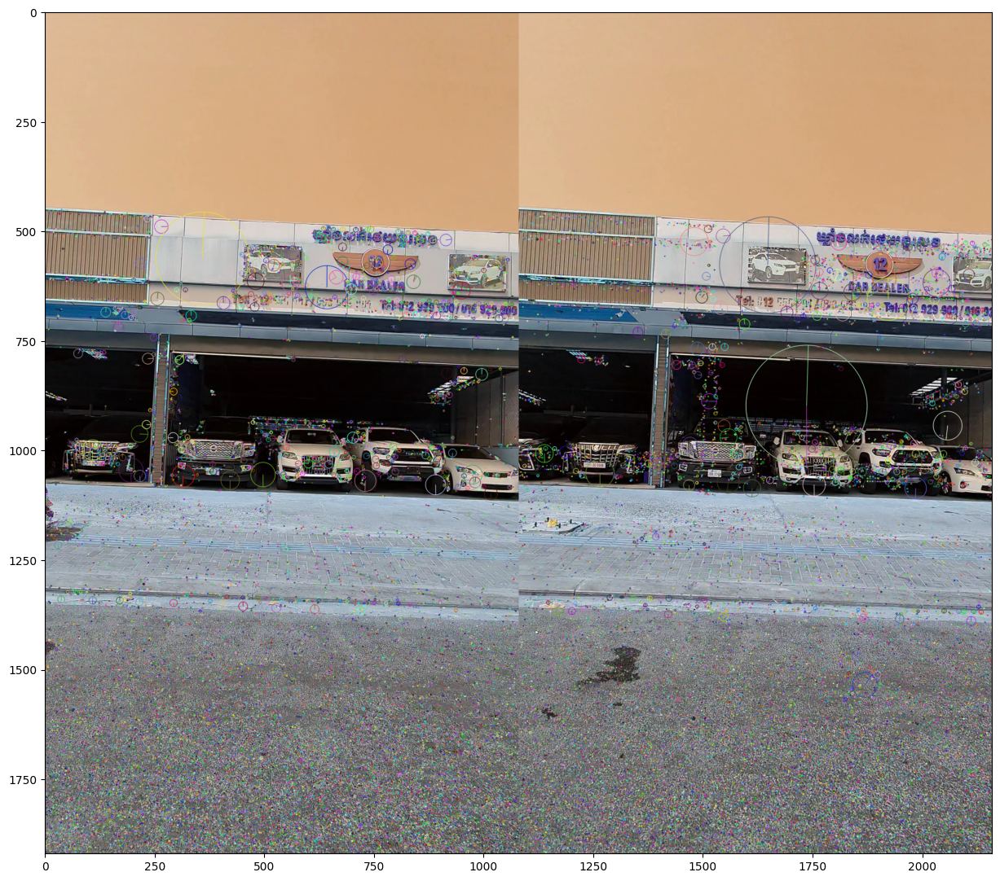

In [184]:
#draw keypoints
img0_kp=features.drawKeypoints(list_images[0],k0)
img1_kp=features.drawKeypoints(list_images[1],k1)

plt_img = np.concatenate((img0_kp, img1_kp), axis=1)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(plt_img))

In [185]:
#matching features using BruteForce 
mat=features.matchFeatures(f0,f1,ratio=0.85,opt='BF')

In [186]:
#Computing Homography matrix and mask
H,matMask=features.generateHomography(list_images[0],list_images[1])


In [187]:
#wrap 2 image
#choose list_images[0] as desination
pano,non_blend,left_side,right_side=stitch.warpTwoImages(list_images[0],list_images[1],True)


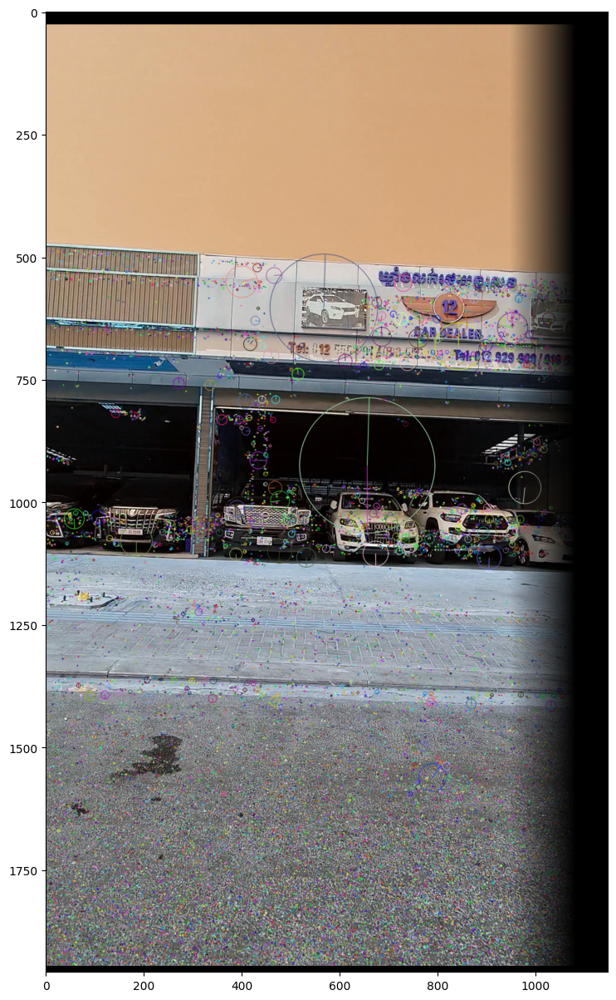

In [188]:
#display the leftside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(left_side))


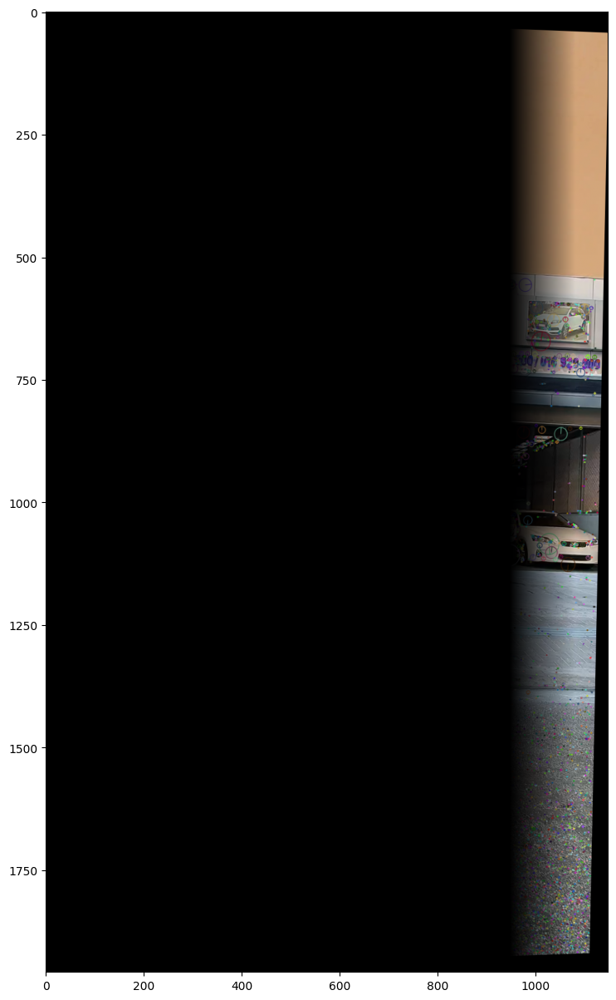

In [189]:
#display the rightside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(right_side))

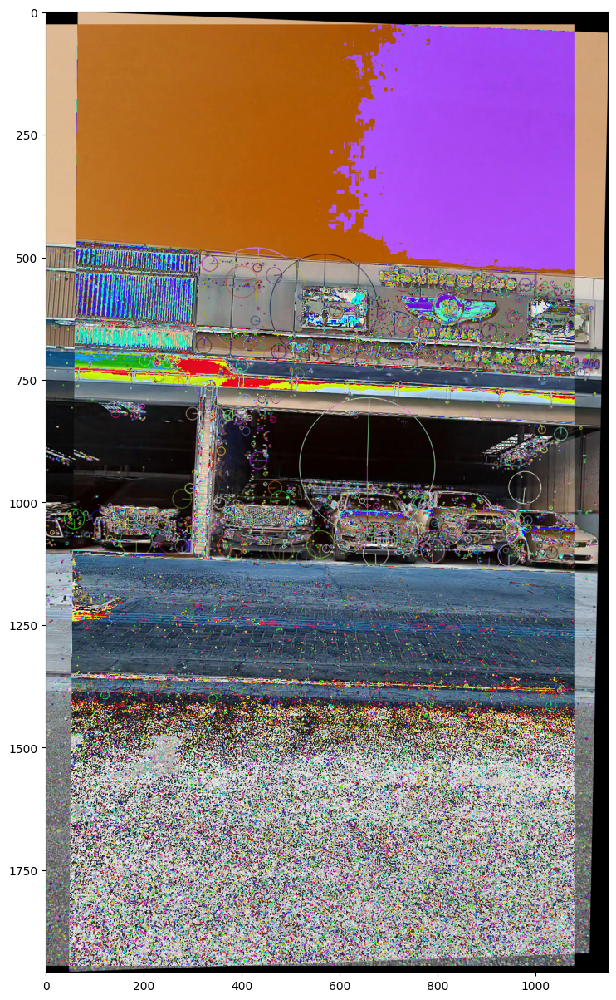

In [190]:
#display pano without cropping and blending
plt.figure(figsize=(15,15))
plt.imshow(convertResult(non_blend))

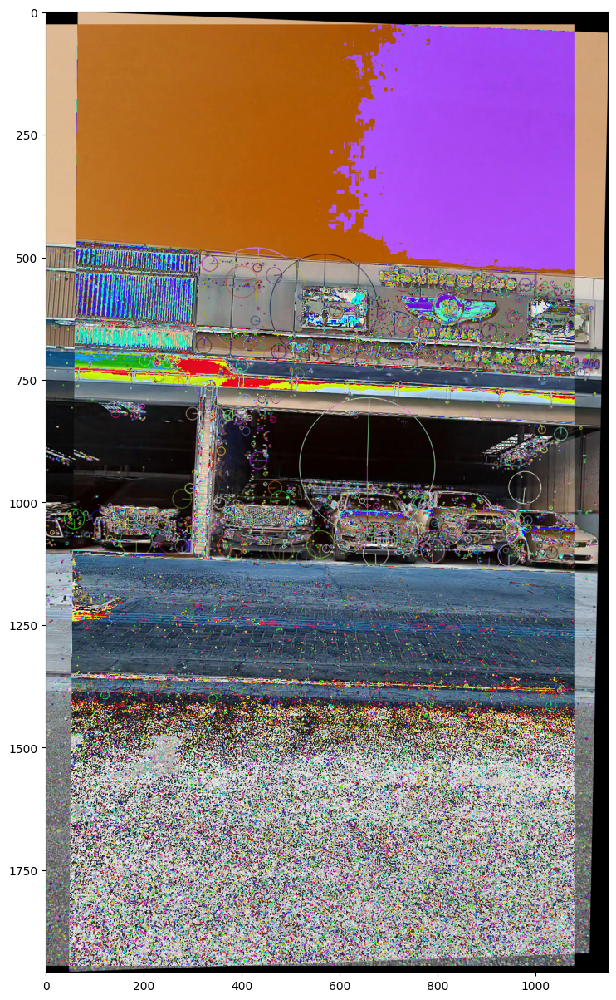

In [191]:
_,non_blend2,_,_=stitch.warpTwoImages(list_images[0],list_images[1],True)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(non_blend2))



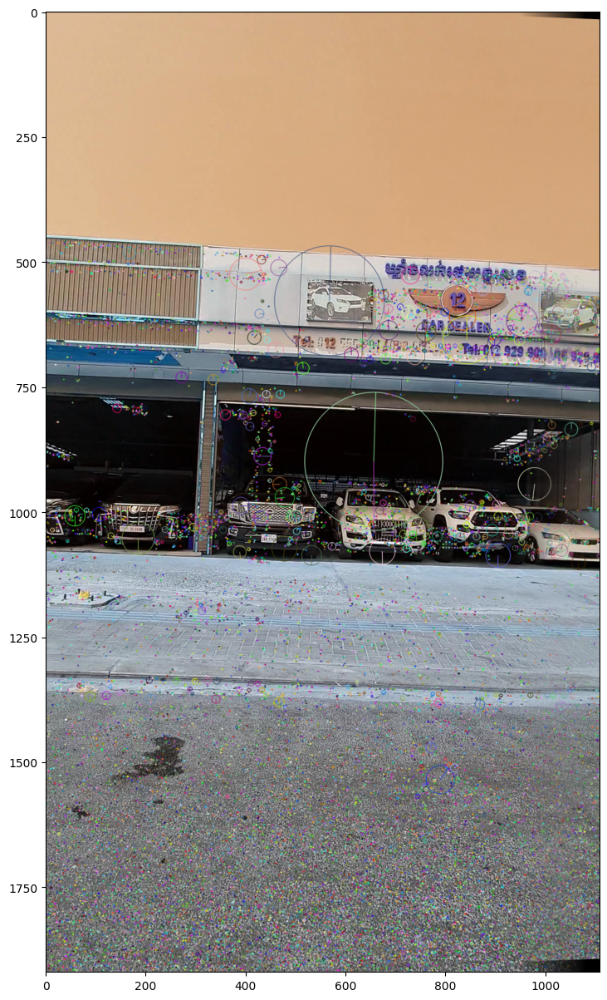

In [192]:
#pano after cropping and blending
plt.figure(figsize=(15,15))
plt.imshow(convertResult(pano))



(-0.5, 1172.5, 1919.5, -0.5)

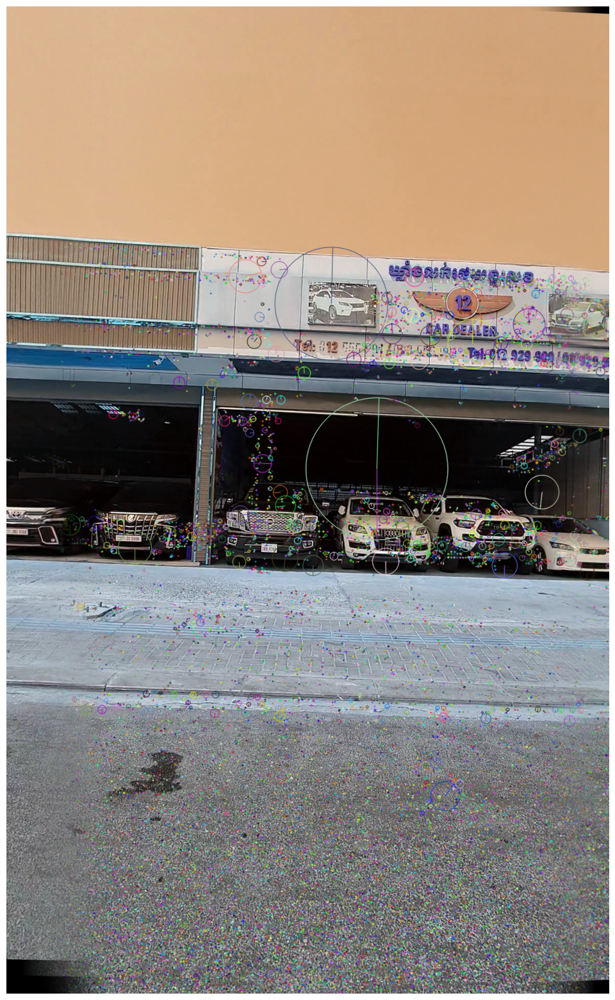

In [193]:
#multi stitching
panorama=stitch.multiStitching(list_images)
plt.figure(figsize=(20,20))
plt.imshow(convertResult(panorama))
plt.axis("off")



# Reconstruction

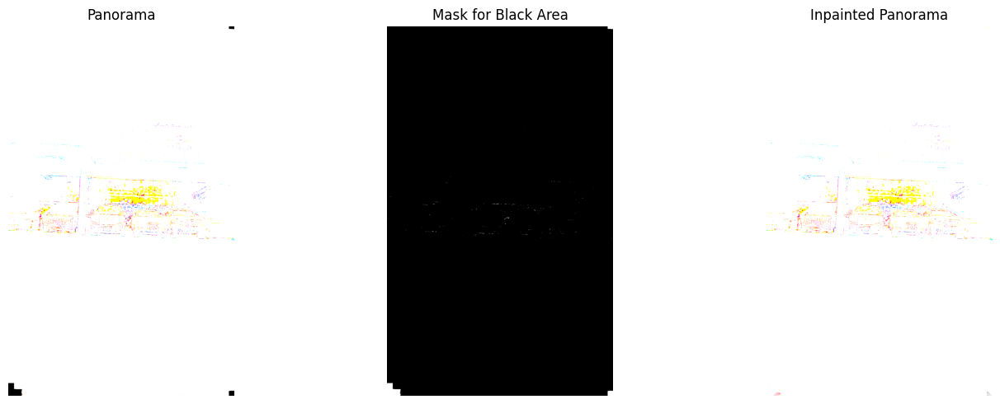

In [194]:

# Convert float panorama to uint8 if needed
if panorama.dtype != np.uint8:
    panorama_uint8 = (panorama * 255).clip(0, 255).astype(np.uint8)
else:
    panorama_uint8 = panorama

# Create a mask for black/near-black pixels (edge region)
gray = cv2.cvtColor(panorama_uint8, cv2.COLOR_BGR2GRAY)
mask = np.uint8(gray < 8) * 255  # All nearly-black pixels

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(panorama_uint8, cv2.COLOR_BGR2RGB))
plt.title('Panorama')
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(mask, cmap='gray')
plt.title('Mask for Black Area')
plt.axis('off')

# Inpaint using OpenCV
reconstructed = cv2.inpaint(panorama_uint8, mask, 7, cv2.INPAINT_TELEA)

plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(reconstructed, cv2.COLOR_BGR2RGB))
plt.title('Inpainted Panorama')
plt.axis('off')
plt.tight_layout()
plt.show()


# Failed...

Panorama dtype: uint8
Min: 0 Max: 255


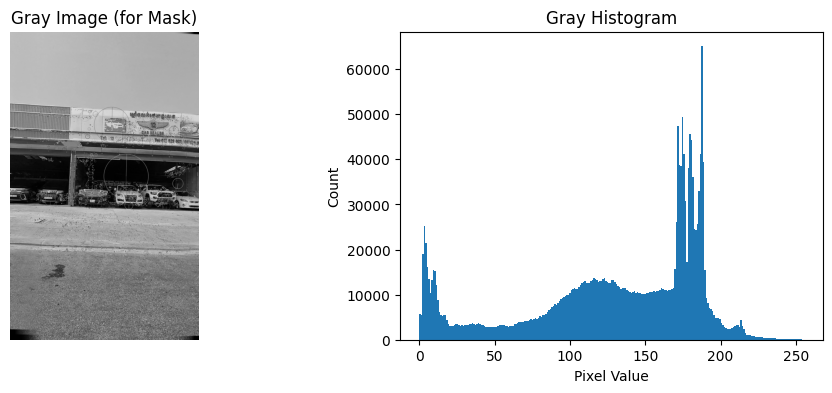

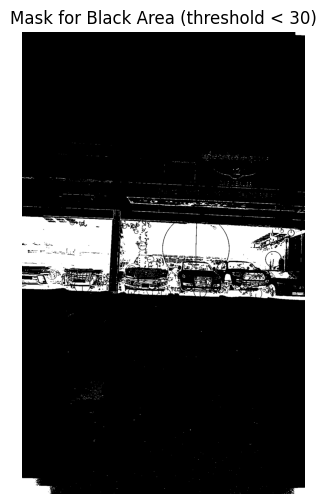

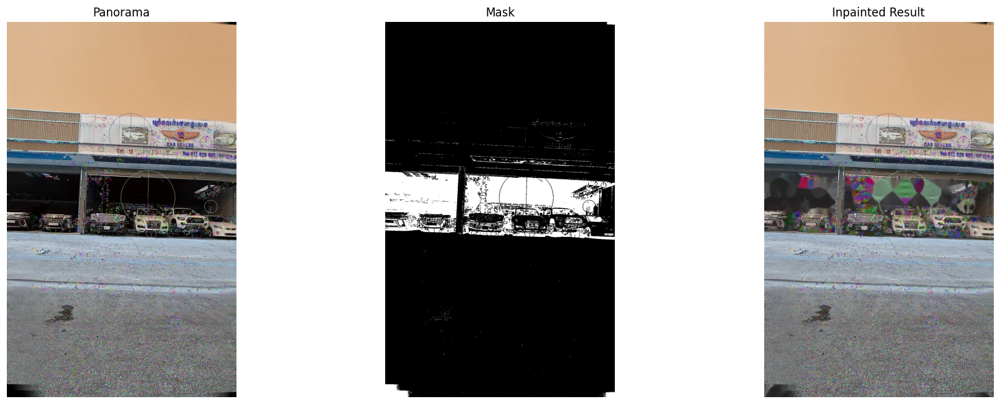

In [200]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -- 1. Convert to uint8 with correct scaling if needed --
if panorama.max() <= 1.0:
    panorama_uint8 = (panorama * 255).clip(0, 255).astype(np.uint8)
else:
    panorama_uint8 = panorama.astype(np.uint8)

print("Panorama dtype:", panorama_uint8.dtype)
print("Min:", panorama_uint8.min(), "Max:", panorama_uint8.max())

# -- 2. Create gray image and show its histogram --
gray = cv2.cvtColor(panorama_uint8, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.imshow(gray, cmap="gray")
plt.title("Gray Image (for Mask)")
plt.axis("off")
plt.subplot(1,2,2)
plt.hist(gray.ravel(), bins=256, range=(0,255))
plt.title("Gray Histogram")
plt.xlabel("Pixel Value")
plt.ylabel("Count")
plt.show()

# -- 3. Try a range of mask thresholds --
# Start with 8, increase if needed (e.g. 20, 30, 40)
threshold = 30
mask = np.uint8(gray < threshold) * 255

plt.figure(figsize=(6, 6))
plt.imshow(mask, cmap="gray")
plt.title(f"Mask for Black Area (threshold < {threshold})")
plt.axis("off")
plt.show()

# -- 4. Inpaint and show results --
reconstructed = cv2.inpaint(panorama_uint8, mask, 7, cv2.INPAINT_TELEA)

plt.figure(figsize=(18, 6))
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(panorama_uint8, cv2.COLOR_BGR2RGB))
plt.title("Panorama")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(mask, cmap="gray")
plt.title("Mask")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(reconstructed, cv2.COLOR_BGR2RGB))
plt.title("Inpainted Result")
plt.axis("off")
plt.tight_layout()
plt.show()


#Success

(-0.5, 1172.5, 1919.5, -0.5)

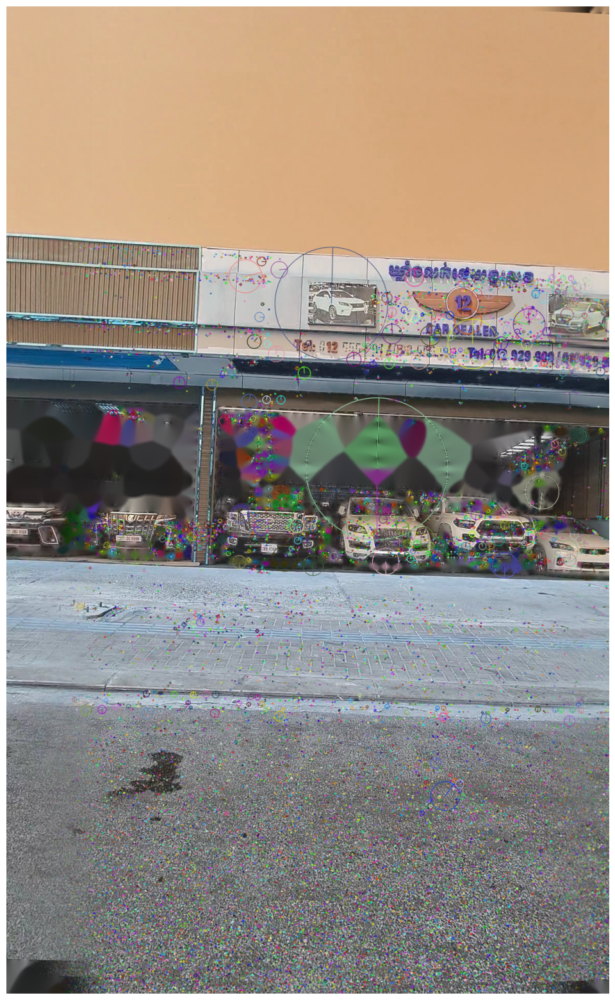

In [201]:
plt.figure(figsize = (20,20))
plt.imshow(cv2.cvtColor(reconstructed, cv2.COLOR_BGR2RGB))
plt.axis("off")

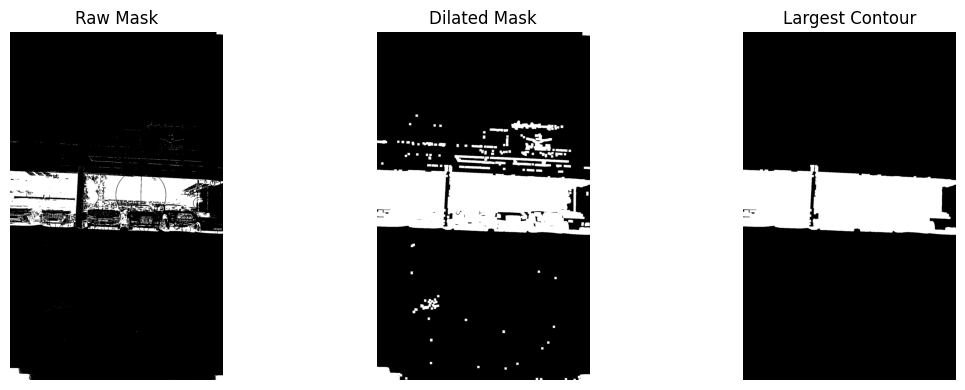

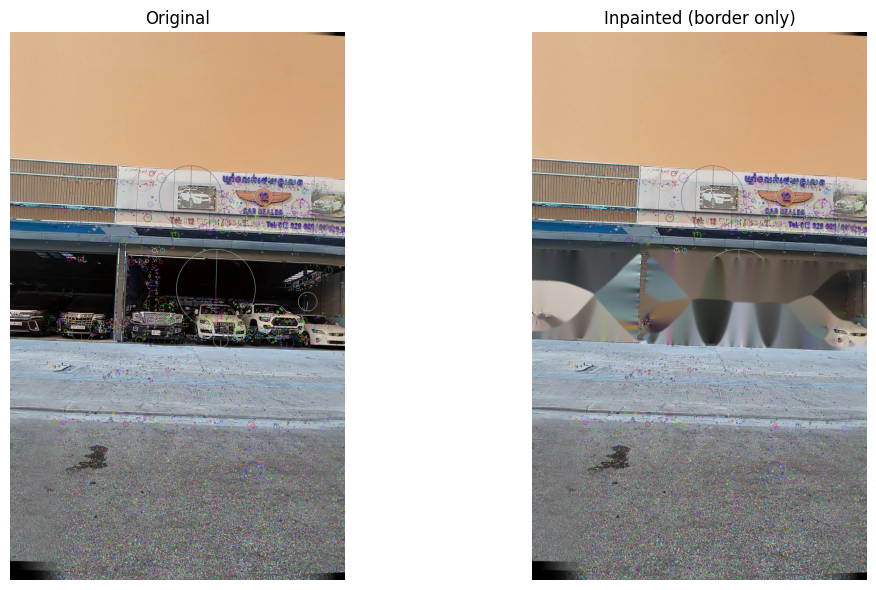

In [197]:
gray = cv2.cvtColor(panorama_uint8, cv2.COLOR_BGR2GRAY)


threshold = 20
mask = np.uint8(gray < threshold) * 255


kernel = np.ones((7,7), np.uint8)
mask_dilated = cv2.dilate(mask, kernel, iterations=2)


result = cv2.findContours(mask_dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = result[0] if len(result) == 2 else result[1]
mask_clean = np.zeros_like(mask)
if contours:
    largest = max(contours, key=cv2.contourArea)
    cv2.drawContours(mask_clean, [largest], -1, 255, thickness=cv2.FILLED)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.imshow(mask, cmap="gray")
plt.title("Raw Mask")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(mask_dilated, cmap="gray")
plt.title("Dilated Mask")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(mask_clean, cmap="gray")
plt.title("Largest Contour")
plt.axis("off")
plt.tight_layout()
plt.show()

reconstructed = cv2.inpaint(panorama_uint8, mask_clean, 7, cv2.INPAINT_TELEA)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(panorama_uint8, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(reconstructed, cv2.COLOR_BGR2RGB))
plt.title("Inpainted (border only)")
plt.axis("off")
plt.tight_layout()
plt.show()


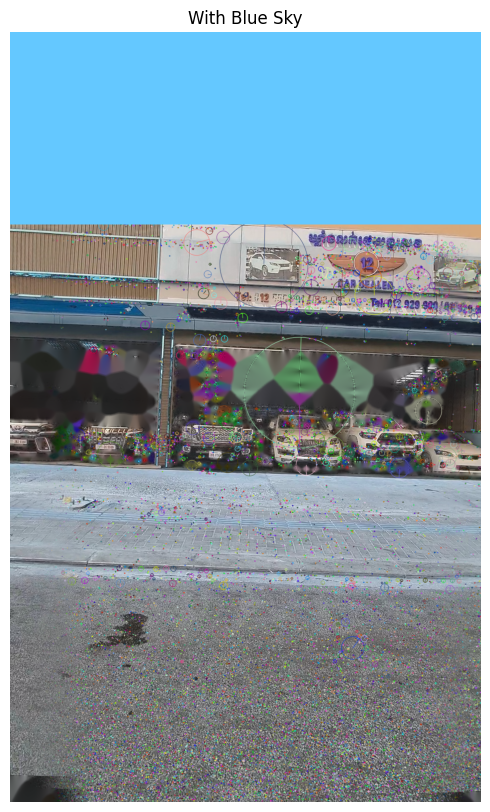

In [202]:
sky_height = panorama_uint8.shape[0] // 4
reconstructed[:sky_height, :, 0] = 255   # Blue channel
reconstructed[:sky_height, :, 1] = 200   # Green channel
reconstructed[:sky_height, :, 2] = 100   # Red channel

plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(reconstructed, cv2.COLOR_BGR2RGB))
plt.title("With Blue Sky")
plt.axis("off")
plt.show()
